# Exploratory Data Analysis

https://www.kaggle.com/competitions/playground-series-s3e22/overview

## Import packages

In [1]:
#%python -m venv sklearn-venv
#%sklearn-venv\Scripts\activate

In [2]:
import pandas as pd

from ydata_profiling import ProfileReport
from dython.nominal import associations

# Import required libraries
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import os
import copy
from sklearn.impute import KNNImputer
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import f1_score, accuracy_score
from xgboost import XGBClassifier

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)


import warnings
warnings.filterwarnings("ignore")

## Define Color Scheme

In [3]:
# Define a dictionary `rc` with custom style settings for plots
rc = {
    "axes.facecolor": "#F8F8F8",  # Background color for plot axes
    "figure.facecolor": "#F8F8F8",  # Background color for the entire figure
    "axes.edgecolor": "#000000",  # Color of the edges of plot axes
    "grid.color": "#EBEBE7" + "30",  # Color of grid lines with transparency
    "font.family": "serif",  # Font family used for text in the plot
    "axes.labelcolor": "#000000",  # Color of axis labels
    "xtick.color": "#000000",  # Color of x-axis tick marks
    "ytick.color": "#000000",  # Color of y-axis tick marks
    "grid.alpha": 0.4  # Transparency level for grid lines
}

# Set the style of seaborn plots using the custom style dictionary
sns.set(rc=rc)

# Define a custom color palette with a list of color codes
palette = ['#302c36', '#037d97', '#E4591E', '#C09741',
           '#EC5B6D', '#90A6B1', '#6ca957', '#D8E3E2']

# Define husl color palette
husl_palette = sns.color_palette("husl", 3)

# Import color styling libraries and define some text styles
from colorama import Style, Fore
blk = Style.BRIGHT + Fore.BLACK  # Bright black text
mgt = Style.BRIGHT + Fore.MAGENTA  # Bright magenta text
red = Style.BRIGHT + Fore.RED  # Bright red text
blu = Style.BRIGHT + Fore.BLUE  # Bright blue text
res = Style.RESET_ALL  # Reset text style to default


## Import data

Descriptions of Horse Survival Data: https://www.kaggle.com/datasets/yasserh/horse-survival-dataset

In [32]:
train_set = pd.read_csv("data/train.csv")
train_set

,id,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,nasogastric_reflux_ph,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data,outcome
0,0,yes,adult,530001,38.1,132.0,24.0,cool,reduced,dark_cyanotic,more_3_sec,depressed,absent,slight,slight,less_1_liter,6.5,decreased,distend_small,57.0,8.5,serosanguious,3.4,yes,2209,0,0,no,died
1,1,yes,adult,533836,37.5,88.0,12.0,cool,normal,pale_cyanotic,more_3_sec,mild_pain,absent,moderate,none,more_1_liter,2.0,absent,distend_small,33.0,64.0,serosanguious,2.0,yes,2208,0,0,no,euthanized
2,2,yes,adult,529812,38.3,120.0,28.0,cool,reduced,pale_pink,less_3_sec,extreme_pain,hypomotile,moderate,slight,none,3.5,NaN,distend_large,37.0,6.4,serosanguious,3.4,yes,5124,0,0,no,lived
3,3,yes,adult,5262541,37.1,72.0,30.0,cold,reduced,pale_pink,more_3_sec,mild_pain,hypomotile,moderate,slight,more_1_liter,2.0,decreased,distend_small,53.0,7.0,cloudy,3.9,yes,2208,0,0,yes,lived
4,4,no,adult,5299629,38.0,52.0,48.0,normal,normal,normal_pink,less_3_sec,alert,hypomotile,none,slight,less_1_liter,7.0,normal,normal,47.0,7.3,cloudy,2.6,no,0,0,0,yes,lived
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1230,1230,yes,adult,535246,38.5,129.0,48.0,cool,reduced,pale_pink,more_3_sec,depressed,absent,moderate,none,more_1_liter,2.0,NaN,distend_large,57.0,66.0,serosanguious,2.0,yes,2206,0,0,no,lived
1231,1231,yes,adult,528570,37.5,60.0,50.0,cool,reduced,pale_cyanotic,less_3_sec,mild_pain,hypomotile,slight,slight,none,3.0,decreased,distend_small,35.0,6.4,serosanguious,3.6,yes,2209,0,0,yes,died
1232,1232,yes,young,529685,37.5,84.0,40.0,normal,reduced,normal_pink,less_3_sec,mild_pain,hypomotile,slight,slight,none,3.0,increased,firm,40.0,5.9,cloudy,7.0,yes,400,0,0,yes,lived
1233,1233,yes,adult,534784,38.1,70.0,16.0,normal,reduced,bright_red,less_3_sec,mild_pain,hypomotile,slight,none,more_1_liter,2.0,absent,distend_small,58.0,74.0,cloudy,2.0,yes,2209,0,0,no,lived


In [33]:
test_set = pd.read_csv("data/test.csv")
test_set

,id,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,nasogastric_reflux_ph,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,1235,no,adult,534053,38.6,40.0,20.0,normal,normal,normal_pink,less_3_sec,mild_pain,hypomotile,slight,none,none,7.0,normal,distend_small,42.0,7.5,clear,2.3,no,0,0,0,no
1,1236,yes,adult,528469,38.2,112.0,48.0,cool,reduced,bright_pink,more_3_sec,depressed,hypomotile,moderate,slight,none,3.5,decreased,distend_small,44.0,6.0,serosanguious,2.6,no,2208,0,0,yes
2,1237,yes,adult,528178,37.7,66.0,12.0,cool,normal,bright_red,less_3_sec,mild_pain,hypomotile,slight,slight,none,3.0,normal,distend_small,31.5,6.0,cloudy,1.6,yes,2205,0,0,yes
3,1238,no,adult,534784,37.1,88.0,20.0,cool,reduced,pale_cyanotic,less_3_sec,depressed,absent,severe,slight,more_1_liter,2.0,absent,distend_large,75.0,81.0,NaN,1.0,yes,1400,0,0,no
4,1239,yes,adult,529840,38.3,50.0,12.0,NaN,normal,bright_pink,less_3_sec,mild_pain,absent,slight,slight,none,3.0,decreased,distend_small,37.0,6.8,cloudy,2.6,yes,2208,0,0,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
819,2054,no,adult,529461,40.3,114.0,36.0,cool,reduced,normal_pink,more_3_sec,depressed,hypomotile,moderate,NaN,none,7.0,normal,distend_large,57.0,8.1,serosanguious,4.5,yes,3205,0,0,yes
820,2055,yes,adult,535338,37.2,100.0,20.0,cool,reduced,pale_cyanotic,more_3_sec,extreme_pain,absent,moderate,slight,more_1_liter,2.0,absent,distend_small,50.0,66.0,serosanguious,2.0,yes,2209,0,0,no
821,2056,yes,adult,529640,39.2,132.0,12.0,cool,reduced,dark_cyanotic,more_3_sec,depressed,hypomotile,moderate,slight,more_1_liter,6.5,decreased,NaN,53.0,7.6,serosanguious,4.5,yes,2205,0,0,no
822,2057,no,adult,5287179,38.3,54.0,66.0,normal,normal,normal_pink,less_3_sec,mild_pain,hypomotile,none,slight,none,7.0,normal,NaN,49.0,8.6,clear,5.0,no,3111,0,0,yes


In [34]:
total = pd.concat([train_set, test_set], ignore_index=True)
total

,id,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,nasogastric_reflux_ph,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data,outcome
0,0,yes,adult,530001,38.1,132.0,24.0,cool,reduced,dark_cyanotic,more_3_sec,depressed,absent,slight,slight,less_1_liter,6.5,decreased,distend_small,57.0,8.5,serosanguious,3.4,yes,2209,0,0,no,died
1,1,yes,adult,533836,37.5,88.0,12.0,cool,normal,pale_cyanotic,more_3_sec,mild_pain,absent,moderate,none,more_1_liter,2.0,absent,distend_small,33.0,64.0,serosanguious,2.0,yes,2208,0,0,no,euthanized
2,2,yes,adult,529812,38.3,120.0,28.0,cool,reduced,pale_pink,less_3_sec,extreme_pain,hypomotile,moderate,slight,none,3.5,NaN,distend_large,37.0,6.4,serosanguious,3.4,yes,5124,0,0,no,lived
3,3,yes,adult,5262541,37.1,72.0,30.0,cold,reduced,pale_pink,more_3_sec,mild_pain,hypomotile,moderate,slight,more_1_liter,2.0,decreased,distend_small,53.0,7.0,cloudy,3.9,yes,2208,0,0,yes,lived
4,4,no,adult,5299629,38.0,52.0,48.0,normal,normal,normal_pink,less_3_sec,alert,hypomotile,none,slight,less_1_liter,7.0,normal,normal,47.0,7.3,cloudy,2.6,no,0,0,0,yes,lived
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2054,2054,no,adult,529461,40.3,114.0,36.0,cool,reduced,normal_pink,more_3_sec,depressed,hypomotile,moderate,NaN,none,7.0,normal,distend_large,57.0,8.1,serosanguious,4.5,yes,3205,0,0,yes,NaN
2055,2055,yes,adult,535338,37.2,100.0,20.0,cool,reduced,pale_cyanotic,more_3_sec,extreme_pain,absent,moderate,slight,more_1_liter,2.0,absent,distend_small,50.0,66.0,serosanguious,2.0,yes,2209,0,0,no,NaN
2056,2056,yes,adult,529640,39.2,132.0,12.0,cool,reduced,dark_cyanotic,more_3_sec,depressed,hypomotile,moderate,slight,more_1_liter,6.5,decreased,NaN,53.0,7.6,serosanguious,4.5,yes,2205,0,0,no,NaN
2057,2057,no,adult,5287179,38.3,54.0,66.0,normal,normal,normal_pink,less_3_sec,mild_pain,hypomotile,none,slight,none,7.0,normal,NaN,49.0,8.6,clear,5.0,no,3111,0,0,yes,NaN


## Basic Statistics

ydata_profiling is a Python library that provides a quick and easy way to generate an exploratory data analysis (EDA) report for a pandas DataFrame.

Tutorial: https://www.datacamp.com/tutorial/pandas-profiling-ydata-profiling-in-python-guide

In [7]:
train_profile = ProfileReport(total, title="Data Set Profiling Report", explorative=True)
train_profile.to_notebook_iframe()

# duration: 30 s

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Observations

**1) Dataset Size:** The training set comprises 1235 entries.

**2) Duplicates:** No duplicate rows were detected within the dataset.

**3) Variables:** The training set consists of 29 variables (columns).

**- Numerical Columns:** 10, including id which is the unique identity key.

**- Binary Categorical Columns:** 3 boolean columns will be treated as binary categorical variables.

**- Categorical Columns:** 16 columns

**However, it's worth noting that there are discrepancies between the reported types and the actual data:**

The 'hospital_number', originally classified as numerical, should be categorical. However, hopistal doesn't related to horse's physical condition, so will consider not include it in featuers.

'lesion_1', 'lesion_2' and 'lesion_3', indicate the type of lesion, based on the descrption of "Horse Survival Data", it should be deemed categorical but no numerical.

**Summary of Column Types in Training Set:**

**- Unique Identifier:** id

**- Categorical Variables:** surgery, age, hospital_number, temp_of_extremities, peripheral_pulse, mucous_membrane, 

capillary_refill_time, pain, peristalsis, abdominal_distention, nasogastric_tube, nasogastric_reflux, 

rectal_exam_feces, abdomen, abdomo_appearance, surgical_lesion, lesion_1, lesion_2, lesion_3， cp_data

**- Numerical Variables:** rectal_temp, pulse, respiratory_rate, nasogastric_reflux_ph, packed_cell_volume, 

total_protein, abomasal_protein

**- Ground Truth:** outcome

**4) Missing Values:** 

A total of 765 missing values were identified in the dataset. All missing values were found in categorical columns. 

**The distribution of missing values across variables is as follows:**

temp_of_extremities: 39

peripheral_pulse: 60

mucous_membrane: 21

capillary_refill_time: 6

pain: 44

peristalsis: 20

abdominal_distention: 23

nasogastric_tube: 80

nasogastric_reflux: 21

rectal_exam_feces: 190

abdomen: 213

abdomo_appearance: 48

In [8]:
# Define a custom function 'summary' that takes a DataFrame 'df' as input
def summary(df):
    # Create a new DataFrame 'sum' to store summary information
    sum = pd.DataFrame(df.dtypes, columns=['dtypes'])  # Column 'dtypes' stores data types of columns
    sum['missing#'] = df.isna().sum()  # Column 'missing#' stores the count of missing values for each column
    sum['missing%'] = (df.isna().sum()) / len(df)  # Column 'missing%' stores the percentage of missing values
    sum['uniques'] = df.nunique().values  # Column 'uniques' stores the count of unique values for each column
    sum['count'] = df.count().values  # Column 'count' stores the count of non-missing values for each column
    # Note: The 'skew' column is commented out and not used in this version of the function

    return sum  # Return the 'sum' DataFrame containing the summary information

summary(total).style.background_gradient(cmap='Blues')

,dtypes,missing#,missing%,uniques,count
id,int64,0,0.000000,2059,2059
surgery,object,0,0.000000,2,2059
age,object,0,0.000000,2,2059
hospital_number,int64,0,0.000000,271,2059
rectal_temp,float64,0,0.000000,43,2059
pulse,float64,0,0.000000,51,2059
respiratory_rate,float64,0,0.000000,42,2059
temp_of_extremities,object,74,0.035940,4,1985
peripheral_pulse,object,107,0.051967,4,1952
mucous_membrane,object,34,0.016513,6,2025


In [9]:
# Define a custom function 'summary' that takes a DataFrame 'df' as input
def summary(df):
    # Create a new DataFrame 'sum' to store summary information
    sum = pd.DataFrame(df.dtypes, columns=['dtypes'])  # Column 'dtypes' stores data types of columns
    sum['missing#'] = df.isna().sum()  # Column 'missing#' stores the count of missing values for each column
    sum['missing%'] = (df.isna().sum()) / len(df)  # Column 'missing%' stores the percentage of missing values
    sum['uniques'] = df.nunique().values  # Column 'uniques' stores the count of unique values for each column
    sum['count'] = df.count().values  # Column 'count' stores the count of non-missing values for each column
    # Note: The 'skew' column is commented out and not used in this version of the function

    return sum  # Return the 'sum' DataFrame containing the summary information

summary(train_set).style.background_gradient(cmap='Blues')

,dtypes,missing#,missing%,uniques,count
id,int64,0,0.000000,1235,1235
surgery,object,0,0.000000,2,1235
age,object,0,0.000000,2,1235
hospital_number,int64,0,0.000000,255,1235
rectal_temp,float64,0,0.000000,43,1235
pulse,float64,0,0.000000,50,1235
respiratory_rate,float64,0,0.000000,37,1235
temp_of_extremities,object,39,0.031579,4,1196
peripheral_pulse,object,60,0.048583,4,1175
mucous_membrane,object,21,0.017004,6,1214


In [10]:
# Define a custom function 'summary' that takes a DataFrame 'df' as input
def summary(df):
    # Create a new DataFrame 'sum' to store summary information
    sum = pd.DataFrame(df.dtypes, columns=['dtypes'])  # Column 'dtypes' stores data types of columns
    sum['missing#'] = df.isna().sum()  # Column 'missing#' stores the count of missing values for each column
    sum['missing%'] = (df.isna().sum()) / len(df)  # Column 'missing%' stores the percentage of missing values
    sum['uniques'] = df.nunique().values  # Column 'uniques' stores the count of unique values for each column
    sum['count'] = df.count().values  # Column 'count' stores the count of non-missing values for each column
    # Note: The 'skew' column is commented out and not used in this version of the function

    return sum  # Return the 'sum' DataFrame containing the summary information

summary(test_set).style.background_gradient(cmap='Blues')

,dtypes,missing#,missing%,uniques,count
id,int64,0,0.000000,824,824
surgery,object,0,0.000000,2,824
age,object,0,0.000000,2,824
hospital_number,int64,0,0.000000,210,824
rectal_temp,float64,0,0.000000,34,824
pulse,float64,0,0.000000,49,824
respiratory_rate,float64,0,0.000000,38,824
temp_of_extremities,object,35,0.042476,4,789
peripheral_pulse,object,47,0.057039,4,777
mucous_membrane,object,13,0.015777,6,811


## Variables Correlation

Dython is a set of data analysis tools in python 3.x. Dython will automatically find which features are categorical and which are numerical, compute a relevant measure of association between each and every feature, and plot it all as an easy-to-read heat-map.

Tutorial: https://medium.com/@knoldus/how-to-find-correlation-value-of-categorical-variables-23de7e7a9e26

Documentation: https://shakedzy.xyz/dython/modules/nominal/

Correlation Coefficients: https://www.andrews.edu/~calkins/math/edrm611/edrm05.htm#:~:text=Correlation%20coefficients%20whose%20magnitude%20are%20between%200.7%20and%200.9%20indicate,can%20be%20considered%20moderately%20correlated.

Correlation coefficients whose magnitude are between 0.7 and 0.9 indicate variables which can be considered highly correlated. 

Correlation coefficients whose magnitude are between 0.5 and 0.7 indicate variables which can be considered moderately correlated. 

Correlation coefficients whose magnitude are between 0.3 and 0.5 indicate variables which have a low correlation. 

Correlation coefficients whose magnitude are less than 0.3 have little if any (linear) correlation.

In [11]:
# associations(train_set, nominal_columns='auto', numerical_columns=None, mark_columns=False, nom_nom_assoc='cramer', num_num_assoc='pearson', cramers_v_bias_correction=True, nan_strategy='replace', nan_replace_value='Unknown', ax=None, figsize=None, annot=True, fmt='.2f', cmap=None, sv_color='silver', cbar=True, vmax=1.0, vmin=None, plot=True, compute_only=False, clustering=False, title=None, filename=None)

# Save heatmap to .png file
complete_correlation= associations(train_set, filename= 'Train Set - HeatMap coolwarm.png', cmap='coolwarm', figsize=(16,16))

# display correlation matrix
df_complete_corr=complete_correlation['corr']
df_complete_corr.dropna(axis=1, how='all').dropna(axis=0, how='all').style.background_gradient(cmap='coolwarm', axis=None)

,id,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,mucous_membrane,capillary_refill_time,pain,peristalsis,abdominal_distention,nasogastric_tube,nasogastric_reflux,nasogastric_reflux_ph,rectal_exam_feces,abdomen,packed_cell_volume,total_protein,abdomo_appearance,abdomo_protein,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data,outcome
id,1.000000,0.001091,0.024725,-0.011094,0.010050,-0.011398,0.010348,0.054953,0.064002,0.062189,0.028321,0.077446,0.072664,0.056753,0.052670,0.051949,-0.031379,0.063458,0.071089,-0.019742,0.020479,0.055506,0.022273,0.003740,0.080642,-0.065084,-0.026604,0.020086,0.047382
surgery,0.001091,1.000000,0.041113,0.050706,0.058994,0.134159,0.108996,0.173705,0.179802,0.273095,0.055025,0.302948,0.232101,0.182798,0.035417,0.101931,0.194118,0.216648,0.375395,0.049160,0.121621,0.207891,0.127531,0.509193,0.074054,0.023602,0.025227,0.175738,0.155017
age,0.024725,0.041113,1.000000,0.158483,0.062943,0.279871,0.189649,0.055866,0.031587,0.138713,0.056830,0.110057,0.000000,0.098600,0.023872,0.000000,0.091045,0.094445,0.281440,0.042230,0.109876,0.037485,0.074228,0.073918,0.000197,0.019189,0.010241,0.068748,0.207945
hospital_number,-0.011094,0.050706,0.158483,1.000000,-0.002552,0.118391,0.085008,0.057662,0.071534,0.087695,0.063023,0.069602,0.059854,0.074494,0.035578,0.079501,0.114354,0.047204,0.086123,-0.018028,-0.154746,0.032953,0.141800,0.067444,0.030844,0.022098,-0.012575,0.047859,0.151153
rectal_temp,0.010050,0.058994,0.062943,-0.002552,1.000000,0.176761,0.124377,0.066055,0.096591,0.128725,0.110494,0.166623,0.080920,0.063685,0.081681,0.136439,0.115980,0.121316,0.066937,0.088986,-0.060842,0.051553,0.043342,0.022199,0.021711,-0.022823,-0.005220,0.007751,0.031170
pulse,-0.011398,0.134159,0.279871,0.118391,0.176761,1.000000,0.395130,0.384807,0.467387,0.446295,0.450325,0.484364,0.378668,0.337126,0.150818,0.086524,-0.010132,0.240270,0.225331,0.435102,0.004373,0.399962,0.056391,0.234095,0.000037,0.021804,0.028273,0.107638,0.344142
respiratory_rate,0.010348,0.108996,0.189649,0.085008,0.124377,0.395130,1.000000,0.188612,0.224342,0.288813,0.199867,0.264480,0.199936,0.197494,0.089060,0.126595,0.003854,0.111529,0.164133,0.188777,0.004018,0.190116,0.004287,0.119134,0.020502,-0.010536,0.009663,0.021069,0.185439
temp_of_extremities,0.054953,0.173705,0.055866,0.057662,0.066055,0.384807,0.188612,1.000000,0.332129,0.264629,0.236273,0.255077,0.244268,0.235521,0.120764,0.076185,0.211216,0.142777,0.147920,0.326411,0.118402,0.256219,0.092782,0.232879,0.073967,0.024254,0.035210,0.136138,0.231990
peripheral_pulse,0.064002,0.179802,0.031587,0.071534,0.096591,0.467387,0.224342,0.332129,1.000000,0.240758,0.226281,0.253650,0.268271,0.226366,0.107238,0.063010,0.265292,0.171318,0.153256,0.412760,0.175484,0.237439,0.126989,0.268785,0.060446,0.028177,0.033836,0.186158,0.259845
mucous_membrane,0.062189,0.273095,0.138713,0.087695,0.128725,0.446295,0.288813,0.264629,0.240758,1.000000,0.333455,0.213949,0.308017,0.248314,0.118841,0.097074,0.147887,0.161921,0.142252,0.484598,0.116410,0.270979,0.139950,0.289756,0.115896,0.065287,0.077924,0.152875,0.248302


#### Observations

1. Many features show a low or little positive correlation with the "outcome" variable, no negative correlation.

Low correlation e.g., pulse, pain, nasogastric_reflux_ph, packed_cell_volume, total_protein.

Consider using features that have a relatively stronger positive correlation with the outcome variable for training machine learning model. 

Features with weak correlations might still contain useful information and could be included in the model to see if they improve predictive performance.


2. Features related to physiological measurements exhibit positive correlations at around 0.4.

(e.g., pulse, respiratory_rate, temp_of_extremities, peripheral_pulse, mucous_membrane, capillary_refill_time, pain, peristalsis, abdominal_distention, packed_cell_volume, abdomo_appearance) 

Might need feature selection techniques to avoid multicollinearity issues and overfitting.

3. Lesion_2 and Lesion_3 presents high correlation of 0.644. 

"Surgery" and "Surgical_lesion" also exists high correlation of 0.509.

"total_protein" and "nasogastric_reflux_ph" exisi high negative correlation of -0.583

4. Additionally, further analysis, such as feature importance ranking or dimensionality reduction, can help refine the feature set for optimal model performance.

## Type of Columns

In [35]:
# define the type of columns by grouping column names
# remove 
col_cat = ['peripheral_pulse', 'mucous_membrane', 'capillary_refill_time', 'pain', 'peristalsis', 'abdominal_distention', 'nasogastric_tube', 'nasogastric_reflux', 'rectal_exam_feces', 'abdomen', 'abdomo_appearance', 'surgical_lesion', 'lesion_1', 'lesion_2', 'lesion_3']
col_bin = ['surgery', 'age', 'temp_of_extremities', 'cp_data']

col_num = ['hospital_number', 'rectal_temp', 'pulse', 'respiratory_rate', 'nasogastric_reflux_ph', 'packed_cell_volume', 'total_protein', 'abdomo_protein']


## Numerical Variables

In [36]:
# Calculate descriptive statistics for numerical variables
total[col_num].describe().T\
    .style.format('{:.2f}')\
    .bar(subset=['mean'], color=px.colors.qualitative.G10[2])\
    .background_gradient(subset=['std'], cmap='Blues')\
    .background_gradient(subset=['50%'], cmap='BuGn')

,count,mean,std,min,25%,50%,75%,max
hospital_number,2059.00,1016073.01,1441049.03,521399.00,528800.00,529796.00,534293.00,5305129.00
rectal_temp,2059.00,38.22,0.79,35.40,37.80,38.20,38.60,40.80
pulse,2059.00,79.84,29.13,30.00,54.00,76.00,100.00,184.00
respiratory_rate,2059.00,30.32,16.85,8.00,18.00,28.00,36.00,96.00
nasogastric_reflux_ph,2059.00,4.43,1.92,1.00,2.00,4.50,6.20,7.50
packed_cell_volume,2059.00,49.39,10.50,23.00,43.00,48.00,56.00,75.00
total_protein,2059.00,21.15,26.57,3.50,6.60,7.50,9.00,89.00
abdomo_protein,2059.00,3.31,1.57,0.10,2.00,3.20,4.30,10.10


In [45]:
%matplotlib inline

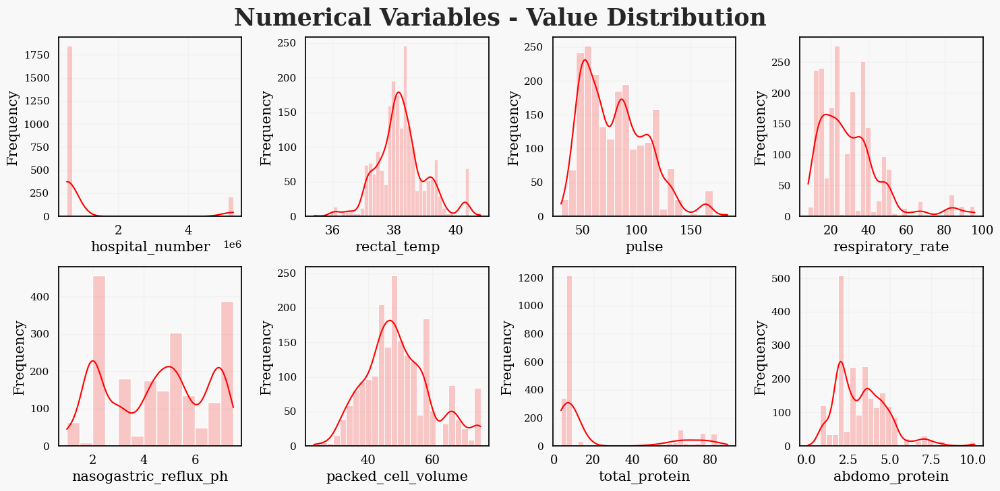

In [46]:
plt.figure(figsize=(15, 7))

for i, col in enumerate(col_num):
    plt.subplot(2, 4, i + 1)
    if col in ['hospital_number', 'total_protein']:  # Check if the column needs binning
        sns.histplot(total, x=col, kde=True, color='red', alpha=0.2, bins=30)  # Adjust the number of bins as needed
    else:
        sns.histplot(total, x=col, kde=True, color='red', alpha=0.2)
    
    plt.xlabel(col, fontsize=15)
    plt.ylabel("Frequency", fontsize=15)
    plt.xticks(fontsize=13)

plt.figtext(0.5, 1, "Numerical Variables - Value Distribution", ha='center', fontweight='bold', fontsize=25)

plt.tight_layout()
plt.show()

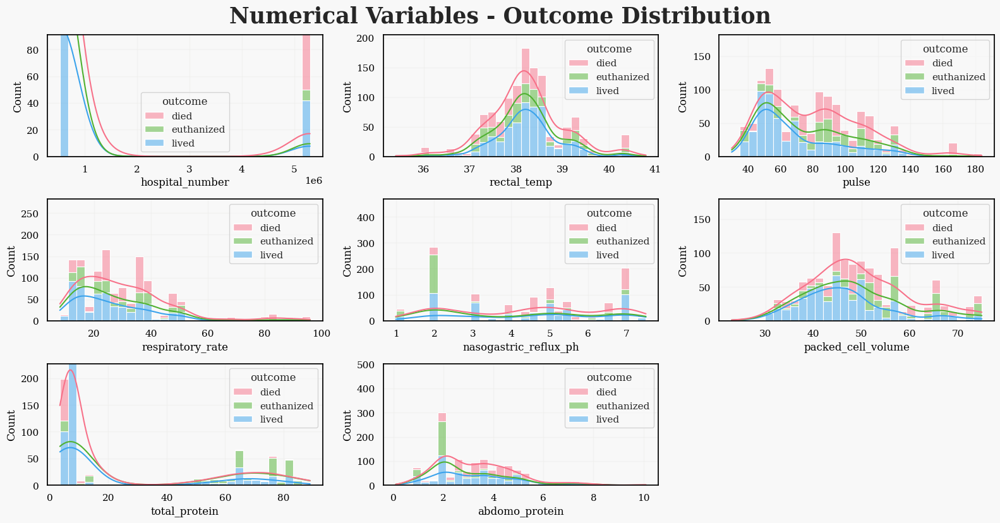

In [47]:
plt.figure(figsize=(16, len(col_num)))

for idx, column in enumerate(col_num):
    plt.subplot(3, 3, idx+1)
    sns.histplot(x=column, hue="outcome", data=train_set, bins=30, kde=True, palette=husl_palette, multiple="stack")
    plt.ylim(0, total[column].value_counts().max() + 10)

plt.figtext(0.5, 1, "Numerical Variables - Outcome Distribution", ha='center', fontweight='bold', fontsize=25)

plt.tight_layout()
plt.show()

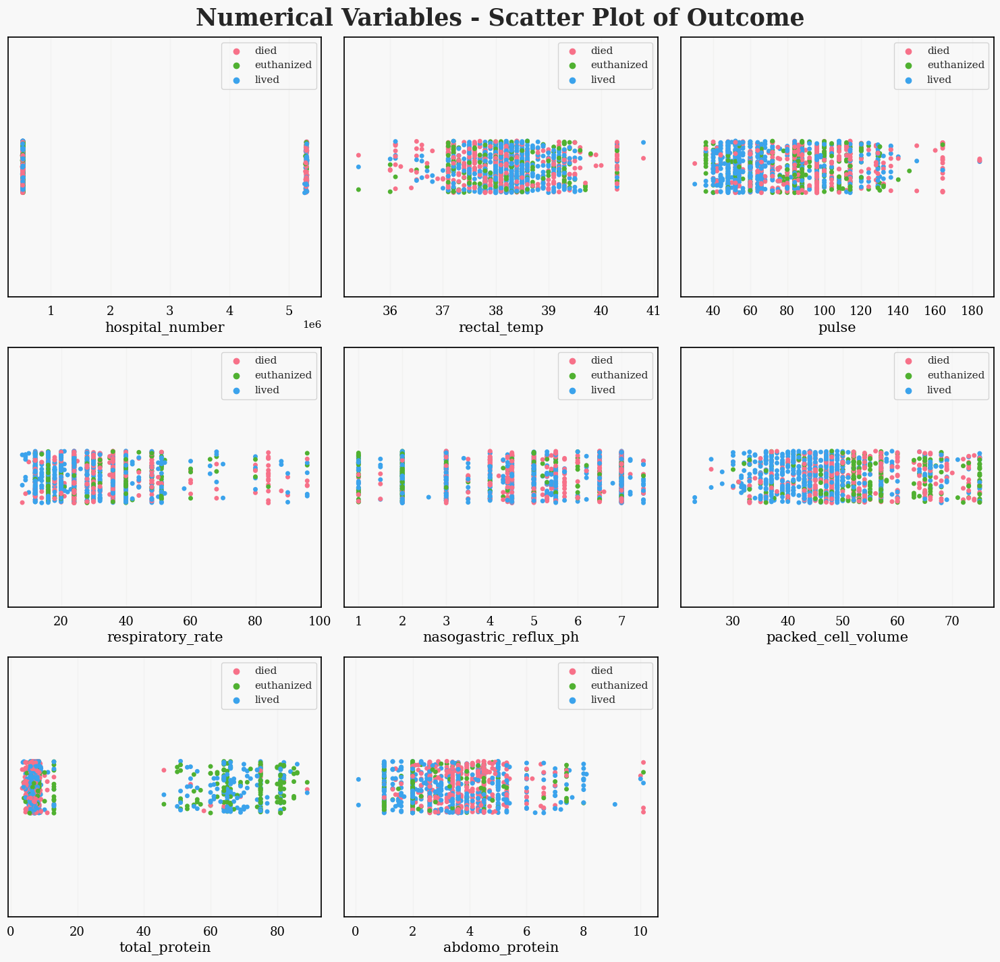

In [48]:
plt.figure(figsize = (15,18))

# Adjust top space for the title
plt.subplots_adjust(top=5)

for i, col in enumerate(col_num):
    plt.subplot(4, 3, i+1)
    sns.stripplot(train_set, x = col, hue = 'outcome', palette=husl_palette)
    plt.xlabel(col, fontsize = 15)
    plt.xticks(fontsize = 13)
    plt.legend(fontsize = 11)

plt.figtext(0.5, 1, "Numerical Variables - Scatter Plot of Outcome", ha='center', fontweight='bold', fontsize=25)

plt.tight_layout()
plt.show()

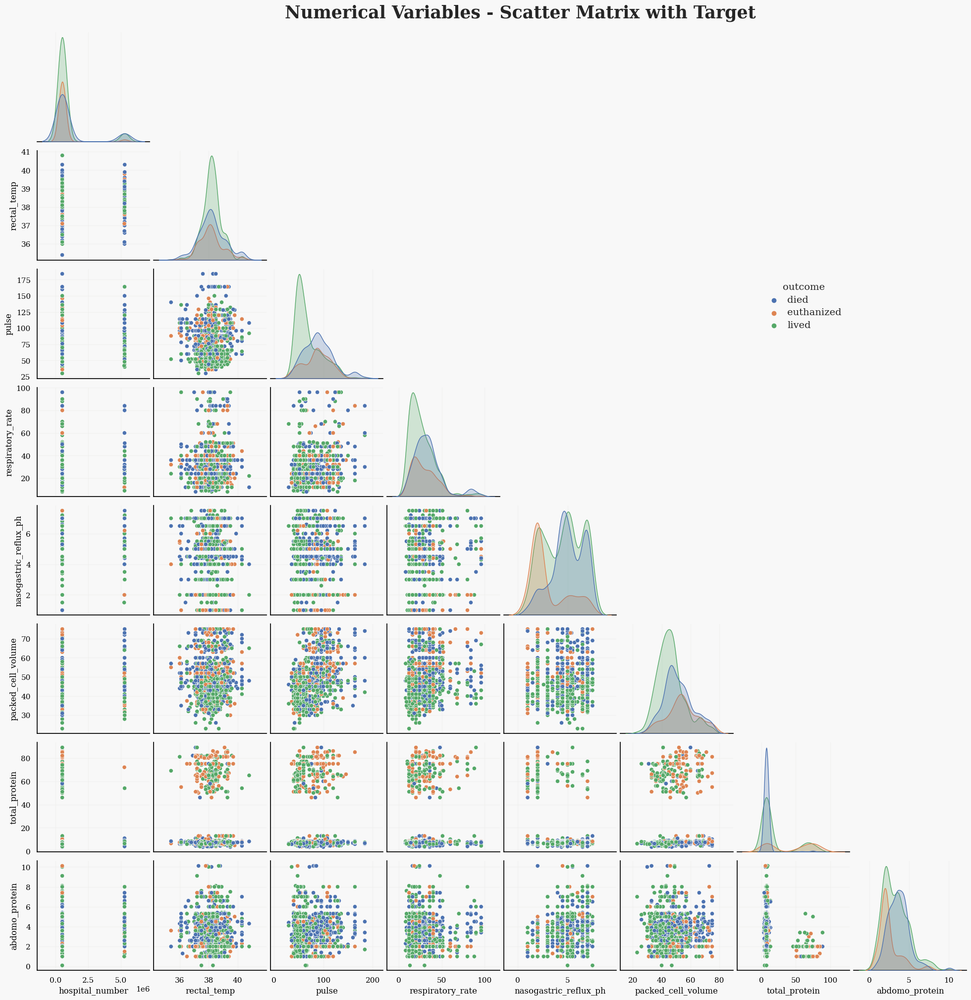

In [49]:
def plot_pair(df_train,num_var,target,plotname):
    
    g = sns.pairplot(data=df_train, x_vars=num_var, y_vars=num_var, hue=target, corner=True)
    g._legend.set_bbox_to_anchor((0.8, 0.7))
    g._legend.set_title(target)
    g._legend.loc = 'upper center'
    g._legend.get_title().set_fontsize(14)
    for item in g._legend.get_texts():
        item.set_fontsize(14)

    plt.figtext(0.5, 1, plotname, ha='center', fontweight='bold', fontsize=25)
    #plt.suptitle(plotname, ha='center', fontweight='bold', fontsize=25, y=0.98)
    plt.show()

plot_pair(total, col_num,'outcome',plotname = 'Numerical Variables - Scatter Matrix with Target')

# duration: 10s

## Categorical Variables

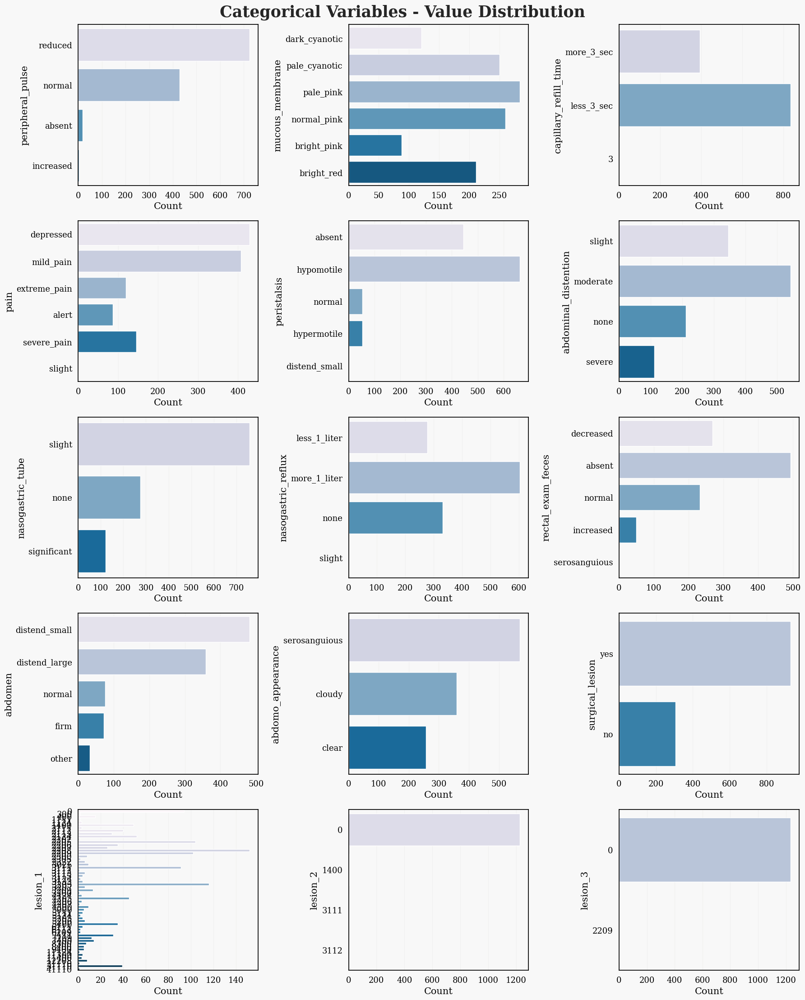

In [60]:
plt.figure(figsize = (18,30))
for i, col in enumerate(col_cat):
    plt.subplot(7, 3, i+1)
    sns.countplot(train_set, y = col, palette="PuBu")
    plt.ylabel(col, fontsize = 15)
    plt.xlabel("Count", fontsize = 15)
    plt.xticks(fontsize = 13)
    plt.yticks(fontsize = 13)

plt.figtext(0.5, 1, "Categorical Variables - Value Distribution", ha='center', fontweight='bold', fontsize=25)
plt.tight_layout()
plt.show()

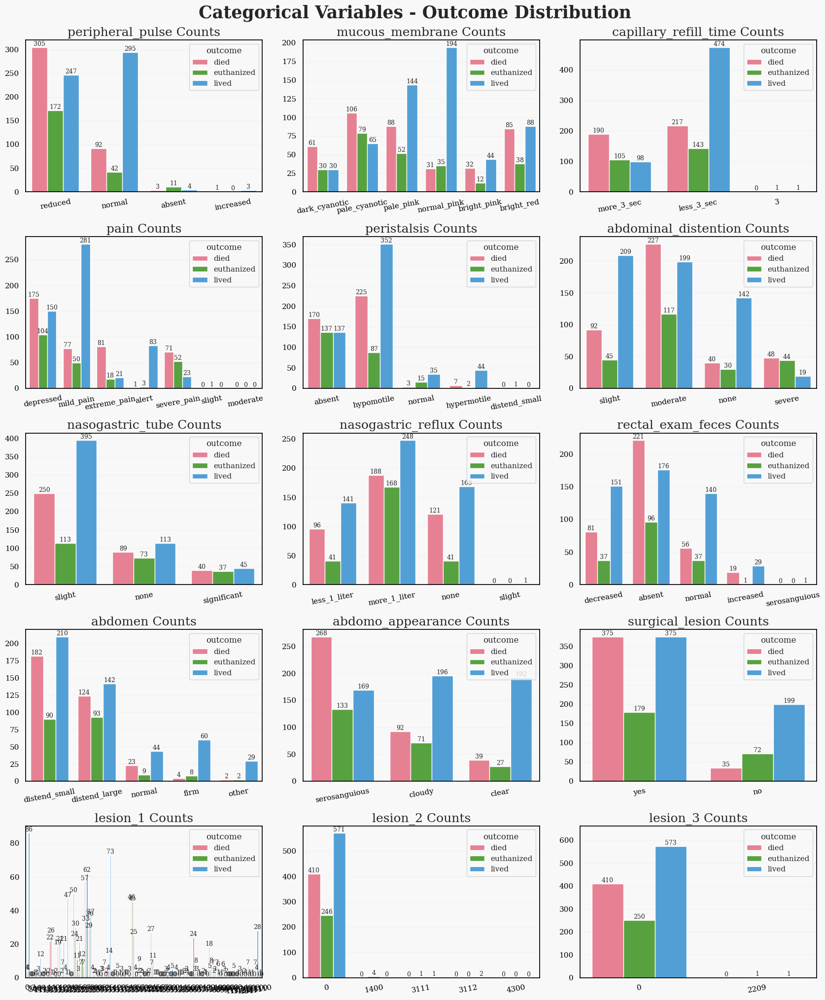

In [61]:
# Countplots for Categorical Variables by Outcome
def plot_count(df, columns, n_cols, hue, palette, title):
    
    n_rows = (len(columns) - 1) // n_cols + 1
    fig, ax = plt.subplots(n_rows, n_cols, figsize=(17, 4 * n_rows))
    ax = ax.flatten()
    
    for i, column in enumerate(columns):
        sns.countplot(data=df, x=column, ax=ax[i], hue=hue, palette=palette)

        # Titles
        ax[i].set_title(f'{column} Counts', fontsize=18)
        ax[i].set_xlabel(None, fontsize=16)
        ax[i].set_ylabel(None, fontsize=16)
        ax[i].tick_params(axis='x', rotation=10)

        for p in ax[i].patches:
            value = int(p.get_height())
            ax[i].annotate(f'{value:.0f}', (p.get_x() + p.get_width() / 2, p.get_height()),
                           ha='center', va='bottom', fontsize=9)

    ylim_top = ax[i].get_ylim()[1]
    ax[i].set_ylim(top=ylim_top * 1.1)
    for i in range(len(columns), len(ax)):
        ax[i].axis('off')

    # fig.suptitle(plotname, fontsize=25, fontweight='bold')
    plt.figtext(0.5, 1, title, ha='center', fontweight='bold', fontsize=25)
    plt.tight_layout()
    plt.show()

plot_count(total, col_cat, 3, 'outcome', husl_palette, 'Categorical Variables - Outcome Distribution')

# duration: 5s

## Binary Variables

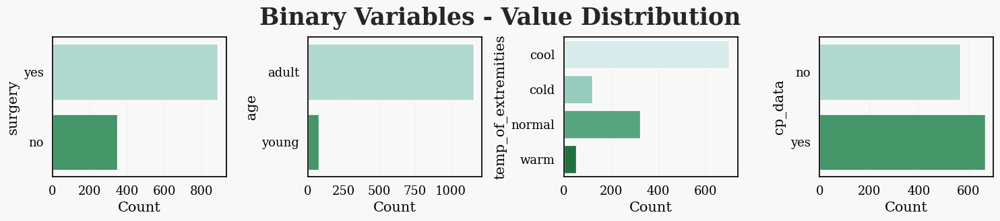

In [52]:
plt.figure(figsize = (15,3))
for i, col in enumerate(col_bin):
    plt.subplot(1, 4, i+1)
    sns.countplot(train_set, y = col, palette="BuGn")
    plt.ylabel(col, fontsize = 15)
    plt.xlabel("Count", fontsize = 15)
    plt.xticks(fontsize = 13)
    plt.yticks(fontsize = 13)
plt.figtext(0.5, 1, "Binary Variables - Value Distribution", ha='center', fontweight='bold', fontsize=25)
plt.tight_layout()
plt.show()

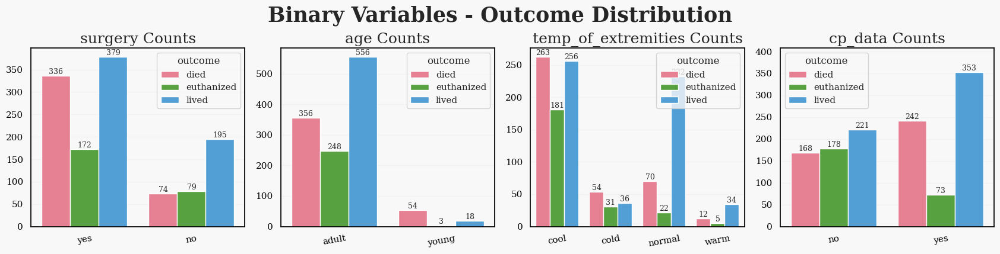

In [53]:
plot_count(total, col_bin, 4, 'outcome', husl_palette, 'Binary Variables - Outcome Distribution')

## Feature Importances

In [54]:
X = pd.get_dummies(train_set.drop('outcome', axis=1), dummy_na=True)
y = train_set['outcome'].map(({'died': 0, 'lived': 1, 'euthanized': 2}))

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, stratify=y, random_state=24)

xgb = XGBClassifier()
xgb.fit(X_train, y_train)
y_preds = xgb.predict(X_test)
microF = f1_score(y_test, y_preds, average='micro')
print("Validation accuracy:", accuracy_score(y_test, y_preds))
print("Micro-averaged F1-Score:", microF)

Validation accuracy: 0.7096774193548387
Micro-averaged F1-Score: 0.7096774193548387


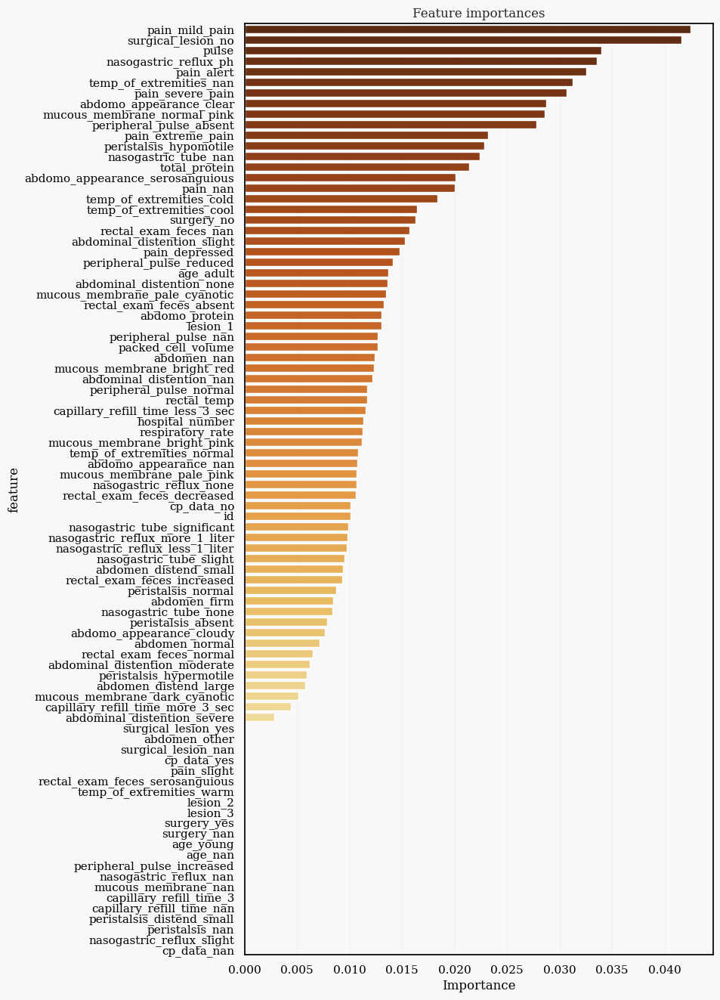

In [55]:
# Plot feature importances
feature_imp = pd.DataFrame({'feature': X_train.columns, 'Importance': xgb.feature_importances_}) 
feature_imp = feature_imp.sort_values('Importance', ascending=False)
plt.figure(figsize=(8,16))
sns.barplot(data=feature_imp, x='Importance', y='feature', palette='YlOrBr_r')

plt.title("Feature importances")
plt.show()

In [56]:
feature_imp.shape

(88, 2)

## Relationship with target variable

In [57]:
from scipy import stats  # SciPy for scientific and statistical functions

def chi_squared_test(df, input_var, target_var, significance_level=0.001):
    contingency_table = pd.crosstab(df[input_var], df[target_var])
    chi2, p, _, _ = stats.chi2_contingency(contingency_table)
    #print(f"{input_var}: {p}")
    if p < significance_level:
        print(f'\033[32m"{input_var}" has a significant relationship with the target variable "{target_var}".\033[0m') 
    else:
        print(f'\033[31m"{input_var}" does not have a significant relationship with the target variable "{target_var}".\033[0m')  

print("Numerical Variables:")
for i in col_num:
    chi_squared_test(train_set, i, 'outcome')
print("Binary Variables:")
for i in col_bin:
    chi_squared_test(train_set, i, 'outcome')
print("Categorical Variables:")
for i in col_cat:
    chi_squared_test(train_set, i, 'outcome')

Numerical Variables:
"hospital_number" has a significant relationship with the target variable "outcome".
"rectal_temp" has a significant relationship with the target variable "outcome".
"pulse" has a significant relationship with the target variable "outcome".
"respiratory_rate" has a significant relationship with the target variable "outcome".
"nasogastric_reflux_ph" has a significant relationship with the target variable "outcome".
"packed_cell_volume" has a significant relationship with the target variable "outcome".
"total_protein" has a significant relationship with the target variable "outcome".
"abdomo_protein" has a significant relationship with the target variable "outcome".
Binary Variables:
"surgery" has a significant relationship with the target variable "outcome".
"age" has a significant relationship with the target variable "outcome".
"temp_of_extremities" has a significant relationship with the target variable "outcome".
"cp_data" has a significant relationship with the